# A practical Time Series introduction

This notes are based on several Datacamp courses, mainly _ARIMA Models in Python_, by James Fulton.

# Index

* [1 - Imports](#1)
* [2 - Load datasets](#2)
* [3 - ARMA models](#3)
    * [3.1 - Motivation](#3.1)
        * [3.1.1 - Example: candy production ](#3.1.1)
	* [3.2 - Time series characteristics](#3.2)
		* [3.2.1 - Example: Amazon stock close price](#3.2.1)
		* [3.2.2 - Example: Amazon stock return (percentage increase of price per day)](#3.2.2)
		* [3.2.3 - Example: Earthquakes per year](#3.2.3)
	* [3.3 - The augmented Dicky-Fuller test](#3.3)
		* [3.3.1 - Example: Stationarity test on earthquakes dataset](#3.3.1)
	* [3.4 - Making a time series stationary](#3.4)
		* [3.4.1 - Example: making Amazon stock time series stationary](#3.4.1)
	* [3.5 - Intro to AR, MA and ARMA models](#3.5)
		* [3.5.1 - AR(p) models](#3.5.1)
		* [3.5.2 - MA(q) models](#3.5.2)
		* [3.5.3 - ARMA models](#3.5.3)
		* [3.5.4 - Simulating ARMA data](#3.5.4)
		* [3.5.5 - Fitting and ARMA model](#3.5.5)
	* [3.6 - Introduction to ARMAX models](#3.6)
		* [3.6.1 - Example: hospital wait times](#3.6.1)
* [4 - Time series forecasting](#4)
	* [4.1 - Introducing forecast](#4.1)
		* [4.1.1 - One-step-ahead predictions](#4.1.1)
		* [4.1.2 - Statsmodels SARIMAX class](#4.1.2)
		* [4.1.3 - One-step-ahead predictions example with simulated data](#4.1.3)
		* [4.1.4 - Dynamic predictions](#4.1.4)
		* [4.1.5 - Dynamic predictions example with simulated data](#4.1.5)
	* [4.2 - Intro to ARIMA models](#4.2)
		* [4.2.1 - Example: Amazon close with differencing](#4.2.1)
* [5 - Choosing the right model](#5)
	* [5.1 - Intro to ACF and PACF](#5.1)
		* [5.1.1 - Example: earthquakes ACF and PACF](#5.1.1)
		* [5.1.2 - Deducing model order with ACF and PACF](#5.1.2)
		* [5.1.3 - Example: earthquakes model order](#5.1.3)
	* [5.2 - Intro to AIC and BIC](#5.2)
		* [5.2.1 - Example: earthquakes AIC and BIC](#5.2.1)
	* [5.3 - Model diagnostics](#5.3)
		* [5.3.1 - Example: earthquakes model diagnostics](#5.3.1)
	* [5.4 - The Box-Jenkins method](#5.4)
* [6 - Seasonal ARIMA models (SARIMA)](#6)
	* [6.1 - Seasonal time series](#6.1)
	* [6.2 - Finding seasonal period using ACF](#6.2)
		* [6.2.1 - Example: finding seasonal period using ACF in the CO2 dataset](#6.2.1)
	* [6.3 - Seasonal decomposition](#6.3)
		* [6.3.1 - Example: CO2 seasonal decomposition](#6.3.1)
	* [6.4 - SARIMA models](#6.4)
	* [6.5 - Seasonal differencing](#6.5)
	* [6.6 - Example: finding all SARIMA orders for the CO2 dataset](#6.6)

# 1 - Imports <a id="1"></a>

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

from IPython.display import Image

# 2 - Load datasets <a id="2"></a>

In [2]:
def process_data(df, datetime_freq, fill_na_method = "bfill"):
    
    df["date"] = pd.to_datetime(df["date"])
    df.sort_values("date", inplace = True)

    complete_dates = pd.date_range(start = df.date.min(), end = df.date.max(), freq = datetime_freq)
    complete_dates_df = pd.DataFrame({"date":complete_dates})
    df = pd.merge(complete_dates_df, df, "left", "date")
    df.sort_values("date", inplace = True)
    df.fillna(method = fill_na_method, inplace = True)

    df.set_index("date", inplace = True)
    
    return df

In [3]:
candy = pd.read_csv("datasets/candy_production.csv")
candy.columns = ["date", "values"]
candy = process_data(candy, datetime_freq = "D")

In [4]:
amazon_close = pd.read_csv("datasets/amazon_close.csv")
amazon_close = process_data(amazon_close, datetime_freq = "D")
amazon_close.dropna(inplace = True)

In [5]:
earthquakes = pd.read_csv("datasets/earthquakes.csv")

In [6]:
earthquakes = pd.read_csv("datasets/earthquakes.csv")
earthquakes.drop("Year", axis = 1, inplace = True)
earthquakes = process_data(earthquakes, datetime_freq = "AS")

In [7]:
hospital = pd.read_csv("datasets/hospital.csv")
hospital = process_data(hospital, datetime_freq = "H")

In [8]:
co2 = pd.read_csv("datasets/co2.csv")
co2 = process_data(co2, datetime_freq = "MS")

# 3 - ARMA models <a id="3"></a>

## 3.1 - Motivation <a id="3.1"></a>

Time series analysis deals with **data that is ordered in time**. 

This type of data is everywhere in this world and it is used in a wide variety of fields. There are many datasets for which we would like to be able to predict the future. Knowing the future of obesity rates could help us intervene now for public health, predicting consumer energy demands could help power stations run more efficiently, predicting how the population of a city will change could help us build the infrastructure we will need.

### 3.1.1 - Example: candy production  <a id="3.1.1"></a>

Let's explore a dataset of monthly US candy production between 1972 and 2018.

Specifically, we are going to plot the industrial production index IPG3113N. This is total amount of sugar and confectionery products produced in the USA per month, as a percentage of the January 2012 production. So 120 would be 120% of the January 2012 industrial production.

Check out how this quantity has changed over time and how it changes throughout the year:

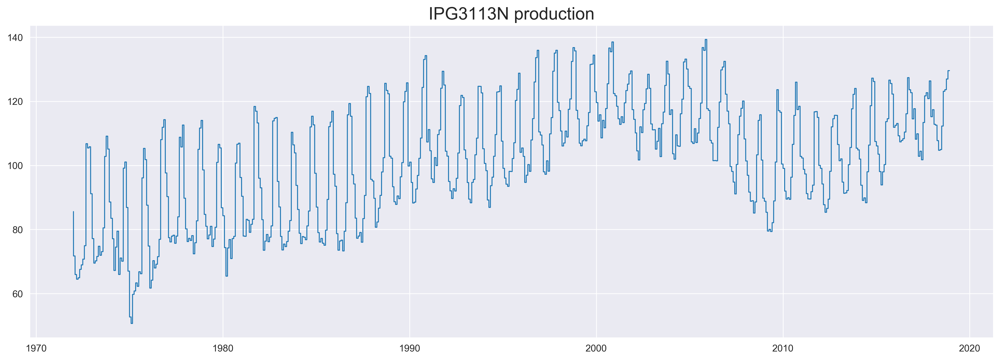

In [9]:
plt.figure(figsize=(18,6), dpi = 300)
x = candy.index
y = candy["values"]
plt.plot(x, y, linewidth = 1)
plt.title("IPG3113N production", fontsize = 18)
plt.show()

## 3.2 - Time series characteristics  <a id="3.2"></a>

One important feature of a time series is its **trend**. A positive trend is a line that generally slopes up - the values increase with time. Similarly, a negative trend is where the values decrease.

Another important feature is **seasonality**. A seasonal time series has patterns that repeat at regular intervals, for example high sales every weekend.

In contrast, **cyclicality** is where there is a repeating pattern but no fixed period.

**To model a time series, it must be stationary**. 

**Stationary** means that the distribution of the data doesn't change with time. For a time series to be stationary it must fulfill three criteria. These are: 
- The series has zero trend
- The variance is constant
- The autocorrelation is constant (how each value in the time series is related to its neighbors stays the same)

### 3.2.1 - Example: Amazon stock close price <a id="3.2.1"></a>

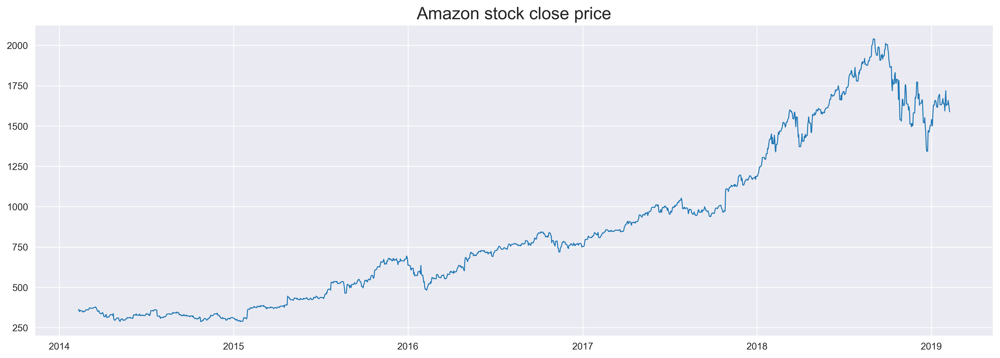

In [10]:
plt.figure(figsize=(18,6), dpi = 300)
x = amazon_close.index
y = amazon_close["close"]
plt.plot(x, y, linewidth = 1)
plt.title("Amazon stock close price", fontsize = 18)
plt.show()

As we can see, this time series is not stationary, because it has a positive trend!

### 3.2.2 - Example: Amazon stock return (percentage increase of price per day) <a id="3.2.2"></a>

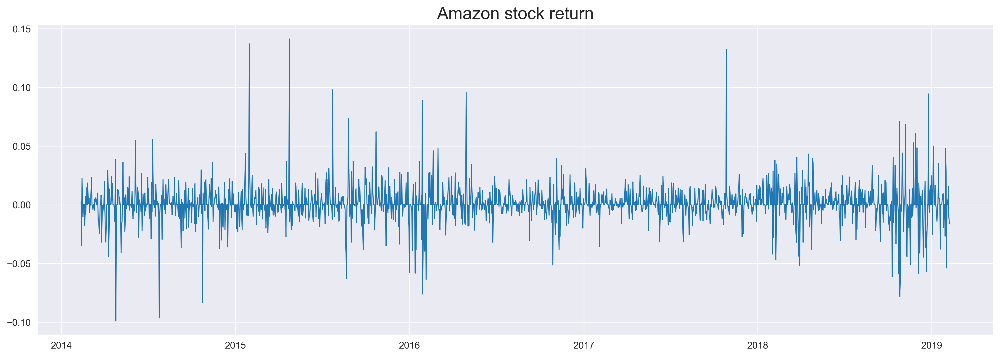

In [11]:
amazon_close["pct_change"] = amazon_close["close"].pct_change()

plt.figure(figsize=(18,6), dpi = 300)
x = amazon_close.index
y = amazon_close["pct_change"]
plt.plot(x, y, linewidth = 1)
plt.title("Amazon stock return", fontsize = 18)
plt.show()

This time series might be not stationary, because it has different variance along time.

### 3.2.3 - Example: Earthquakes per year <a id="3.2.3"></a>

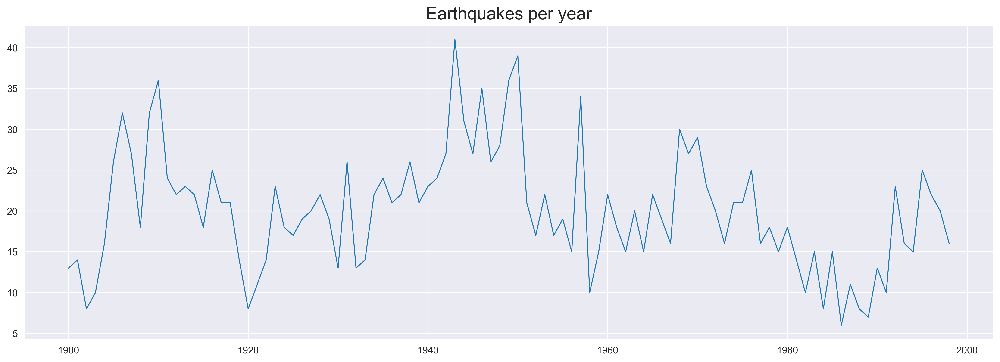

In [12]:
plt.figure(figsize=(18,6), dpi = 300)
x = earthquakes.index
y = earthquakes["earthquakes_per_year"]
plt.plot(x, y, linewidth = 1)
plt.title("Earthquakes per year", fontsize = 18)
plt.show()

This time series seems to be stationary!

## 3.3 - The augmented Dicky-Fuller test <a id="3.3"></a>

We learned about ways in which a time series can be non-stationary, and how we can identify it by plotting. However, there are more formal ways of accomplishing this task, with statistical tests. 

The most common test for identifying whether a time series is non-stationary is the **augmented Dicky-Fuller test**. This is a statistical test, where the null hypothesis is that your time series is non-stationary **due to trend**.

We can implement the augmented Dicky-Fuller test using statsmodels: https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html

### 3.3.1 - Example: Stationarity test on earthquakes dataset <a id="3.3.1"></a>

We will run the augmented Dicky-Fuller test on the earthquakes time series to test for stationarity. 

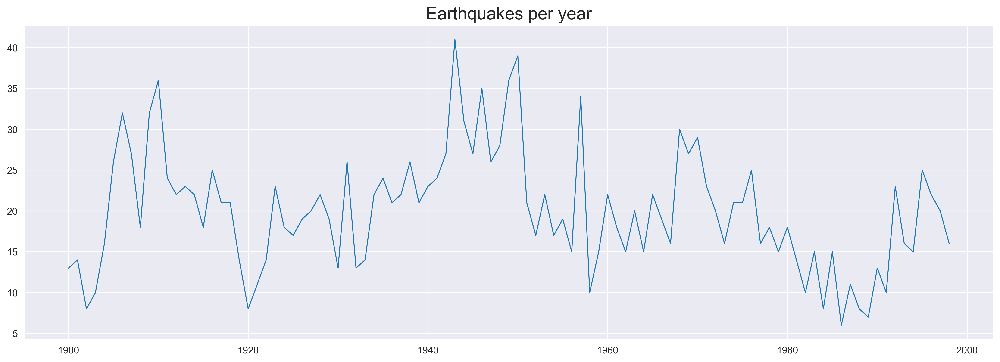

In [13]:
plt.figure(figsize=(18,6), dpi = 300)
x = earthquakes.index
y = earthquakes["earthquakes_per_year"]
plt.plot(x, y, linewidth = 1)
plt.title("Earthquakes per year", fontsize = 18)
plt.show()

It looks like it could be stationary, but earthquakes are very damaging. If we want to make predictions about them we better be sure.

Remember that if it were not stationary this would mean that the number of earthquakes per year has a trend and is changing. This would be terrible news if it is trending upwards, as it means more damage. It would also be terrible news if it were trending downwards, it might suggest the core of our planet is changing and this could have lots of knock on effects for us!

In [14]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(earthquakes["earthquakes_per_year"])
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 0.020978425256003668


**We can reject the null hypothesis that the time series is non-stationary (due by trend)!**

We probably could have intuited this from looking at the graph or by knowing a little about geology (the time series covers only about 100 years which is a very short time on a geological time scale).

Remember that it is always worth plotting our time series as well as doing the statistical tests. **These tests are very useful but sometimes they don't capture the full picture.**

Remember that Dicky-Fuller only tests for **trend stationarity**. We can make an example where although the time series behavior clearly changes, and is non-stationary, it passes the Dicky-Fuller test.

## 3.4 - Making a time series stationary <a id="3.4"></a>

So let's say we have a time series that is non-stationary. We need to transform the data into a stationary form before we can model it. You can think of this a bit like feature engineering in classic machine learning.

- One very common way to make a time series stationary is to take its **difference**. This is where, from each value in our time series we subtract the previous value. Sometimes taking the difference is enough to make it stationary, but for other time series we may need to take the difference more than once.

- Sometimes we will need to perform **other transformations** to make the time series stationary. This could be to take the log, or the square root of a time series, or to calculate the proportional change. It can be hard to decide which of these to do, but often the simplest solution is the best one.

### 3.4.1 - Example: making Amazon stock time series stationary <a id="3.4.1"></a>

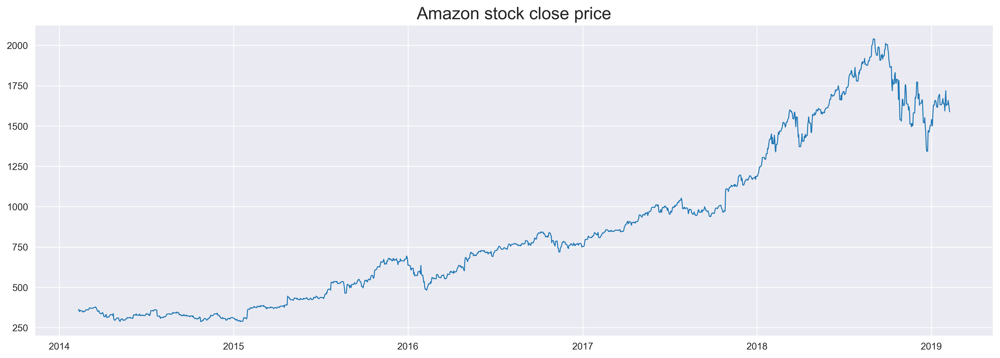

In [15]:
plt.figure(figsize=(18,6), dpi = 300)
x = amazon_close.index
y = amazon_close["close"]
plt.plot(x, y, linewidth = 1)
plt.title("Amazon stock close price", fontsize = 18)
plt.show()

Differencing should be the first transform you try to make a time series stationary:

In [16]:
amazon_close["close_diff_1"] = amazon_close["close"].diff()

result = adfuller(amazon_close["close_diff_1"].dropna())
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 6.910728075798461e-13


We can reject the null hypothesis that the time series is non-stationary **due by trend**.

Let's make a plot to check stationarity visually:

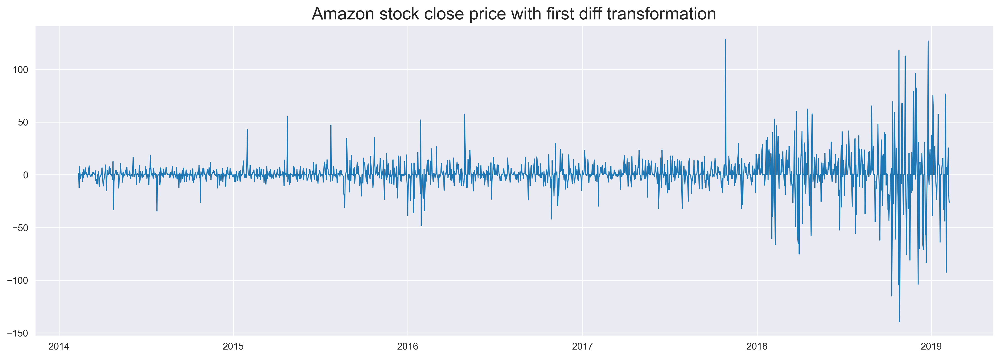

In [17]:
plt.figure(figsize=(18,6), dpi = 300)
x = amazon_close.index
y = amazon_close["close_diff_1"]
plt.plot(x, y, linewidth = 1)
plt.title("Amazon stock close price with first diff transformation", fontsize = 18)
plt.show()

Note that diff transformation **doesn't show a constant variance**, so it isn't stationary!

Differencing should be the first transform you try to make a time series stationary. But sometimes it isn't the best option.

A classic way of transforming stock time series is the log-return of the series. 

This is calculated as follows:

$$log\_return(y_t) = log \left( \dfrac{y_t}{y_{t-1}} \right)$$

In [18]:
amazon_close["close_log_return"] =  np.log(amazon_close["close"] / amazon_close["close"].shift(1))

result = adfuller(amazon_close["close_log_return"].dropna())
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 0.0


We can reject the null hypothesis that the time series is non-stationary **due by trend**.

Let's make a plot to check stationarity visually:

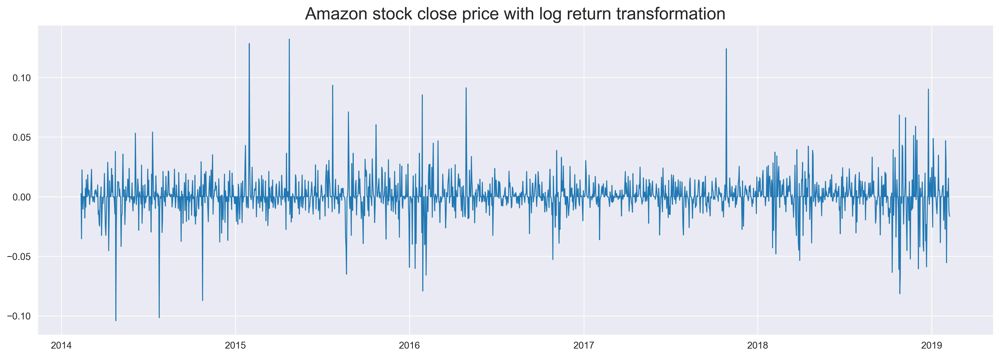

In [19]:
plt.figure(figsize=(18,6), dpi = 300)
x = amazon_close.index
y = amazon_close["close_log_return"]
plt.plot(x, y, linewidth = 1)
plt.title("Amazon stock close price with log return transformation", fontsize = 18)
plt.show()

Now this seems to be a stationary time series!

Notice that both the differenced and the log-return transformed time series have a small p-value, but the log transformed time series has a much more negative test statistic. This means the log-return tranformation is better.

## 3.5 - Intro to AR, MA and ARMA models <a id="3.5"></a>

Now that we know how to prepare our data, lets dive straight into the models. We will discuss AR and MA models and how these are combined into ARMA models.

### 3.5.1 - AR(p) models <a id="3.5.1"></a>

In an **autoregressive model** we regress the values of the time series against previous values of this same time series. The equation for an AR model of order $p$ is: 

$$y_t = a_{1} y_{t-1} + a_{2} y_{t-2} + ... + a_{p} y_{t-p} + \epsilon_t,$$

where $\epsilon_t$ is white noise, meaning is random and not related to the other shocks in the series. 

$a_k$ is the autoregressive coefficient at lag $k$. The order of the model is the number of time lags used ($p$).

### 3.5.2 - MA(q) models <a id="3.5.2"></a>

In a **moving average model** we regress the values of the time series against the previous shock values of this same time series. The equation for an MA model of order $q$ is: 

$$y_t = m_{1} \epsilon_{t-1} + m_{2} \epsilon_{t-2} + ... + m_{q} \epsilon_{t-q} + \epsilon_t,$$

where $\epsilon_t$ is white noise, meaning is random and not related to the other shocks in the series. 

$a_k$ is the autoregressive coefficient at lag $k$. The order of the model is the number of time lags used ($q$).

### 3.5.3 - ARMA models <a id="3.5.3"></a>

An **ARMA** model is a combination of the AR and MA models. The time series is regressed on the previous values and the previous shock terms. The equation for an ARMA$(p, q)$ model is: 

$$y_t = \left( a_{1} y_{t-1} + a_{2} y_{t-2} + ... + a_{p} y_{t-p} \right) + \left( m_{1} \epsilon_{t-1} + m_{2} \epsilon_{t-2} + ... + m_{q} \epsilon_{t-q} \right) + \epsilon_t,$$

where $\epsilon_t$ is white noise, meaning is random and not related to the other shocks in the series. 

$p$ tells us the order of the autoregressive part of the model and $q$ tells us the order of the moving average part.

### 3.5.4 - Simulating ARMA data <a id="3.5.4"></a>

Let's simulate the ARMA(2,2) process: 

$$y_t = \left( 0.5 y_{t-1} + 0.2 y_{t-2} \right) + \left( -0.2 \epsilon_{t-1} + 0.1 \epsilon_{t-2} \right) + \epsilon_t,$$

where $\epsilon_t$ has $std = 1$.

In [20]:
from statsmodels.tsa.arima_process import arma_generate_sample

# Set coefficients
ar_coefs = [1, -0.5, -0.2] # -> we must pass inverted signs
ma_coefs = [1, -0.2, 0.1]

"""
Remember for any model ARMA(p,q):

The list ar_coefs has the form [1, -a_1, -a_2, ..., -a_p].
The list ma_coefs has the form [1, m_1, m_2, ..., m_q],
where a_i are the lag-i AR coefficients and m_j are the lag-j MA coefficients.
"""

y_sim = arma_generate_sample(ar_coefs, ma_coefs, nsample = 10000, scale = 1)

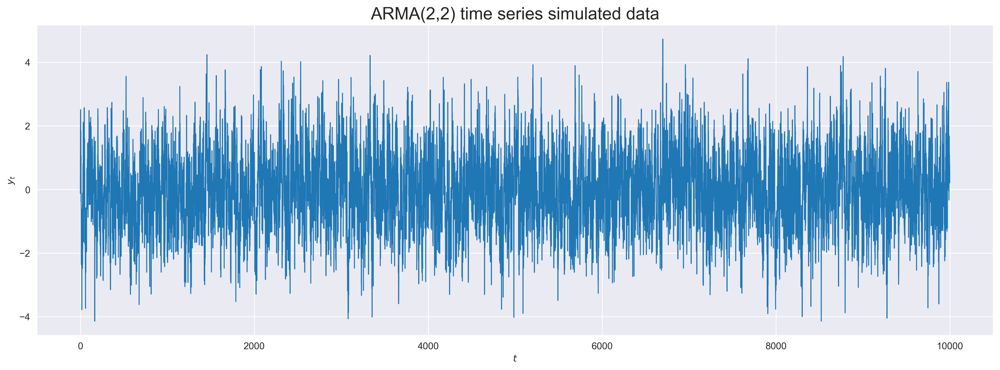

In [21]:
plt.figure(figsize=(18,6), dpi = 300)
plt.plot(y_sim, linewidth = 1)
plt.ylabel(r'$y_t$')
plt.xlabel(r'$t$')
plt.title("ARMA(2,2) time series simulated data", fontsize = 18)
plt.show()

### 3.5.5 - Fitting and ARMA model <a id="3.5.5"></a>

Let's fit an ARMA(2,2) model to the $y$ simulated data before:

$$y_t = \left( 0.5 y_{t-1} + 0.2 y_{t-2} \right) + \left( -0.2 \epsilon_{t-1} + 0.1 \epsilon_{t-2} \right) + \epsilon_t,$$

where $\epsilon_t$ has std = 1.

In [22]:
from statsmodels.tsa.arima_model import ARMA

# Instantiate the model
model = ARMA(y_sim, order=(2,2))

# Fit the model
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                10000
Model:                     ARMA(2, 2)   Log Likelihood              -14110.919
Method:                       css-mle   S.D. of innovations              0.992
Date:                Sat, 12 Dec 2020   AIC                          28233.837
Time:                        22:04:19   BIC                          28277.099
Sample:                             0   HQIC                         28248.481
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0176      0.031     -0.565      0.572      -0.079       0.043
ar.L1.y        0.4873      0.047     10.480      0.000       0.396       0.578
ar.L2.y        0.2193      0.042      5.250      0.000       0.137       0.301
ma.L1.y       -0.1824      0.047     -3.902      0.000      -0.274      -0.091
ma.L2.y        0.1021      0.029      3.559      0.000       0.046       0.158
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.2961           +0.0000j            1.2961            0.0000
AR.2           -3.5185           +0.0000j            3.5185            0.5000
MA.1            0.8934           -2.9997j            3.1299           -0.2039
MA.2            0.8934           +2.9997j            3.1299            0.2039
-----------------------------------------------------------------------------
"""

## 3.6 - Introduction to ARMAX models <a id="3.6"></a>

One possible extension to the ARMA model is to use exogenous inputs to create the **ARMAX model**. This means that we model the time series using other independent variables as well as the time series itself. 

This is like a combination between an ARMA model and a normal linear regression model:

$$y_t = \left( a_{1} y_{t-1} + a_{2} y_{t-2} + ... + a_{p} y_{t-p} \right) + \left( m_{1} \epsilon_{t-1} + m_{2} \epsilon_{t-2} + ... + m_{q} \epsilon_{t-q} \right) + \epsilon_t + x_1 z_t$$

where $\epsilon_t$ is white noise.

### 3.6.1 - Example: hospital wait times <a id="3.6.1"></a>

As an example, let's fit an ARMAX model to a time series which represents the wait times at an accident and emergency room for urgent medical care.

The variable we would like to model is the wait times to be seen by a medical professional (wait_times_hrs). This may be related to an exogenous variable that we measured (nurse_count) which is the number of nurses on shift at any given time. These can be seen below:

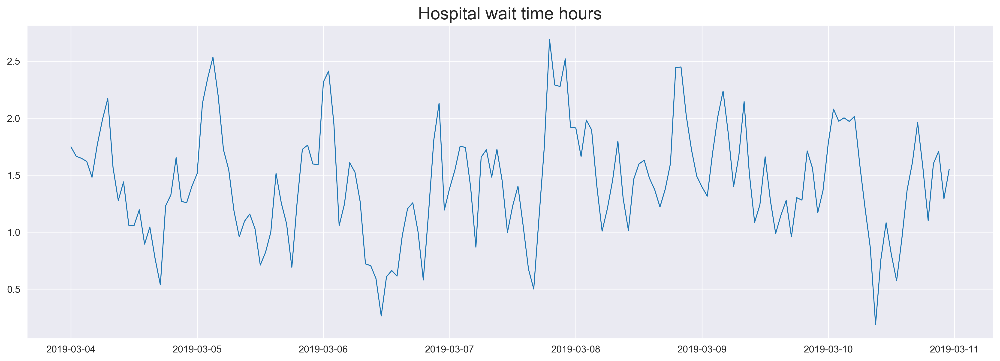

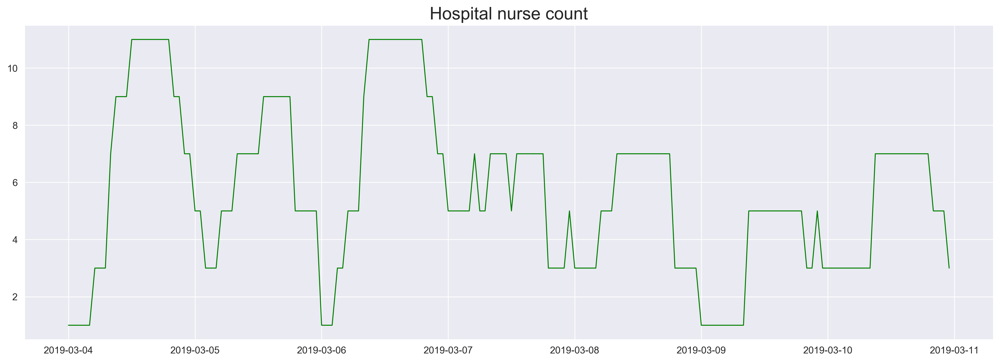

In [23]:
plt.figure(figsize=(18,6), dpi = 300)
x = hospital.index
y = hospital["wait_times_hrs"]
plt.plot(x, y, linewidth = 1)
plt.title("Hospital wait time hours", fontsize = 18)
plt.show()

plt.figure(figsize=(18,6), dpi = 300)
x = hospital.index
y = hospital["nurse_count"]
plt.plot(x, y, linewidth = 1, color = "g")
plt.title("Hospital nurse count", fontsize = 18)
plt.show()

This is a particularly interesting case of time series modeling as, if the number of nurses has an effect, you could change this to affect the wait times. 

In [24]:
# Instantiate the model
model = ARMA(hospital.wait_times_hrs, order = (2,1), exog = hospital.nurse_count, freq = "H")

# Fit the model
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:         wait_times_hrs   No. Observations:                  168
Model:                     ARMA(2, 1)   Log Likelihood                 -11.834
Method:                       css-mle   S.D. of innovations              0.259
Date:                Sat, 12 Dec 2020   AIC                             35.668
Time:                        22:04:20   BIC                             54.411
Sample:                    03-04-2019   HQIC                            43.275
                         - 03-10-2019                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    2.1000      0.086     24.293      0.000       1.931       2.269
nurse_count             -0.1171      0.013     -9.054      0.000      -0.142      -0.092
ar.L1.wait_times_hrs     0.5693      0.164      3.468      0.001       0.248       0.891
ar.L2.wait_times_hrs    -0.1612      0.131     -1.226      0.220      -0.419       0.096
ma.L1.wait_times_hrs     0.3728      0.157      2.375      0.018       0.065       0.680
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7656           -1.7566j            2.4906           -0.1246
AR.2            1.7656           +1.7566j            2.4906            0.1246
MA.1           -2.6827           +0.0000j            2.6827            0.5000
-----------------------------------------------------------------------------
"""

Since the relation between the number of nurses on shift and the wait times is negative (-0.1171), if we predicted that tomorrow was going to have long wait times, we could combat this by adding more nurses!

# 4 - Time series forecasting <a id="4"></a>

## 4.1 - Introducing forecast <a id="4.1"></a>

Now that we know how to fit models, let's use them to predict the future.

Take a simple AR(1) model:

$$y_t = 0.6 y_{t-1} + \epsilon_t,$$

where $\epsilon_t$ has std = 1. 

At any point $t$ in the time series we can estimate the next series value $y_t$. 

We make this prediction by multiplying the previous value $y_{t-1}$ by $a_1=0.6$. 

So if the previous value was 10, we would estimate the next value as $y_t = 0.6 * 10 = 6$. 

Since the shock term has a standard deviation of 1, we would predict our lower and upper uncertainty limits to be 5 and 7.

### 4.1.1 - One-step-ahead predictions <a id="4.1.1"></a>

In the time period we have data for, we can make lots of these predictions in-sample using the previous series value to estimate the next ones. This is called a **one-step-ahead prediction**. 

This allows us to evaluate how good our model is at predicting just one value ahead. 

### 4.1.2 - Statsmodels SARIMAX class <a id="4.1.2"></a>

Previously we had been using the ARMA model class from statsmodels. From now on we will use the SARIMAX class. This model class can do everything that the ARMA model class can do and can be extended even further. This class has an additional model order which we will cover later. What's important now is that a SARIMAX model with order (p,0,q) is exactly the same as an ARMA(p,q) model.

We can also add a constant to the model using trend equals c. If the time series isn't centered around zero this is a must.

### 4.1.3 - One-step-ahead predictions example with simulated data <a id="4.1.3"></a>

Let's take the ARMA(2,2) model that we fitted to simulated data.

In [25]:
from statsmodels.tsa.arima_process import arma_generate_sample

ar_coefs = [1, -0.5, -0.2]
ma_coefs = [1, -0.2, 0.1]

y = arma_generate_sample(ar_coefs, ma_coefs, nsample=10000, scale=1)
simulated_data = pd.DataFrame(y)
simulated_data.columns = ["values"]

from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(simulated_data, order = (2,0,2))

# Fit the model
results = model.fit()

Once we fit the model we are ready to make predictions:

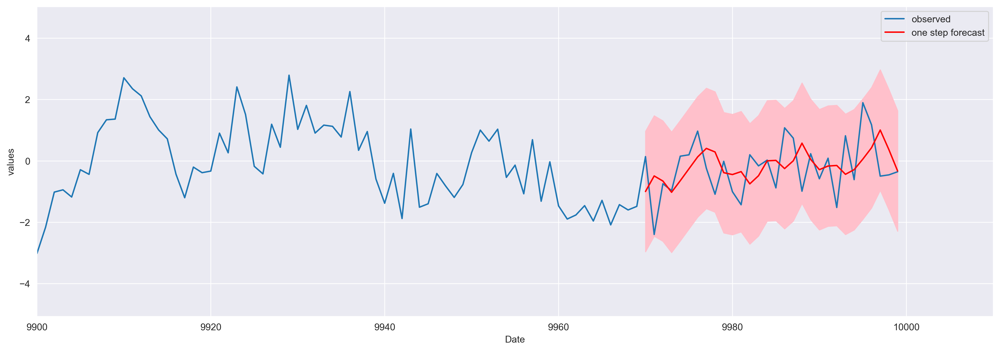

In [26]:
# Generate predictions
one_step_forecast = results.get_prediction(start = -30)

# Extract prediction mean
os_mean_forecast = one_step_forecast.predicted_mean

# Get confidence intervals of  predictions
os_confidence_intervals = one_step_forecast.conf_int()

# Select lower and upper confidence limits
os_lower_limits = os_confidence_intervals.loc[:,'lower values']
os_upper_limits = os_confidence_intervals.loc[:,'upper values']

plt.figure(figsize=(18,6), dpi = 300)

plt.plot(y, label='observed')

plt.plot(os_mean_forecast.index, os_mean_forecast, color='r', label='one step forecast')
plt.fill_between(os_lower_limits.index, os_lower_limits, os_upper_limits, color='pink')

plt.xlim(9900, 10010)
plt.xlabel('Date')
plt.ylabel('values')
plt.legend()
plt.show()

Here, the mean prediction is marked with a red line while the uncertainty range is shaded. The uncertainty is due to the random shock terms that we can't predict.

### 4.1.4 - Dynamic predictions <a id="4.1.4"></a>

We can make predictions further than just one step ahead. To make these dynamic predictions we predict one step ahead, and use this predicted value to forecast the next value after that ... and so on. Since we don't know the shock term at each step, our uncertainty can grow very quickly.

### 4.1.5 - Dynamic predictions example with simulated data <a id="4.1.5"></a>

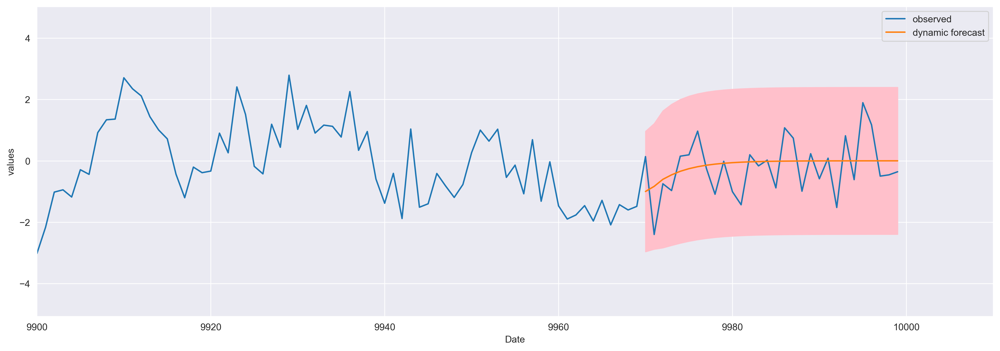

In [27]:
# Generate predictions
dynamic_step_forecast = results.get_prediction(start = -30, dynamic = True)

# Extract prediction mean
d_mean_forecast = dynamic_step_forecast.predicted_mean

# Get confidence intervals of  predictions
d_confidence_intervals = dynamic_step_forecast.conf_int()

# Select lower and upper confidence limits
d_lower_limits = d_confidence_intervals.loc[:,'lower values']
d_upper_limits = d_confidence_intervals.loc[:,'upper values']

plt.figure(figsize=(18,6), dpi = 300)

plt.plot(y, label='observed')

plt.plot(d_mean_forecast.index, d_mean_forecast, label='dynamic forecast')
plt.fill_between(d_lower_limits.index, d_lower_limits, d_upper_limits, color='pink')

plt.xlim(9900, 10010)
plt.xlabel('Date')
plt.ylabel('values')
plt.legend()
plt.show()

## 4.2 - Intro to ARIMA models <a id="4.2"></a>

Now let's tie together forecasting and non-stationarity and show how we can overcome some problems that happen when these things meet.

We learned that we cannot apply an ARMA model to non-stationary time series. We can for example take the difference of the time series to make it stationary. Only then can we model it.

However, when we do this, we will have a model which is trained to predict the value of the difference of the time series. What we really want to predict is not the difference, but the actual value of the time series. We can achieve this by carefully transforming our prediction of the differences.

We start with predictions of the difference values. The opposite of taking the difference is taking the cumulative sum or integral. We will need to use this transform to go from predictions of the difference values to predictions of the absolute values. We can do this using the numpy cumsum function. If we apply this function we now have a prediction of how much the time series changed from its initial value over the forecast period. To get an absolute value we need to add the last value of the original time series to this.

We now have a forecast of the non-stationary time series. If we would like to plot our uncertainties as before we will need to carefully transform them as well.

These steps of starting with non-stationary data; differencing to make it stationary; and then integrating the forecast are very common in time series modeling. This is a lot of work! But thankfully, there is a extension of the ARMA model which does it for us! This is the **ARIMA**, or autoregressive **integrated** moving average model.

We can implement an ARIMA model using the SARIMAX model class from statsmodels. The ARIMA model has three model orders. These are p the autoregressive order; d the order of differencing; and q the moving average order. Before we were setting the middle order parameter d to zero. If d is zero we simply have an ARMA model.

We must still be careful about selecting the right amount of differencing. Remember, we difference our data only until it is stationary and no more. We will work this out before we apply our model, using the augmented Dicky-Fuller test to decide the difference order.

### 4.2.1 - Example: Amazon close with differencing <a id="4.2.1"></a>

We will fit an ARMA model to the Amazon stocks dataset. As we saw before, this is a non-stationary dataset. We will use differencing to make it stationary so that we can fit an ARMA model.

Instead of taking the difference, modeling the difference and then integrating, we're just going to lets statsmodels do the hard work for us. Then, we'll make the forecast.

In [60]:
# Create ARIMA(2,1,2) model
arima = SARIMAX(amazon_close[["close"]], order=(2,1,2), freq = "D")

# Fit ARIMA model
results = arima.fit()

# Generate predictions
forecast = results.get_prediction(start=-15, end = "2019-02-15", dynamic = True)

# Extract prediction mean
mean_forecast = forecast.predicted_mean

# Get confidence intervals of  predictions
confidence_intervals = forecast.conf_int()

# Select lower and upper confidence limits
d_lower_limits = confidence_intervals.loc[:,'lower close']
d_upper_limits = confidence_intervals.loc[:,'upper close']

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


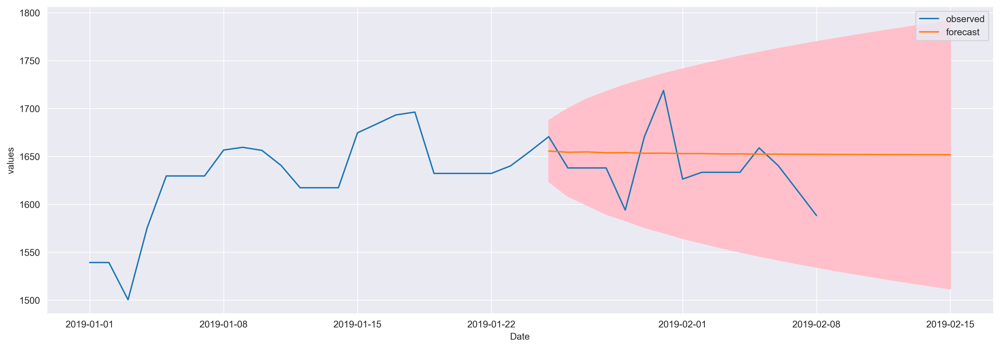

In [62]:
plt.figure(figsize=(18,6), dpi = 300)

plt.plot(amazon_close[amazon_close.index >= "2019"].index, amazon_close[amazon_close.index >= "2019"].close, label='observed')

plt.plot(mean_forecast.index, mean_forecast, label='forecast')
plt.fill_between(d_lower_limits.index, d_lower_limits, d_upper_limits, color='pink')

plt.xlabel('Date')
plt.ylabel('values')
plt.legend()
plt.show()

# 5 - Choosing the right model <a id="5"></a>

## 5.1 - Intro to ACF and PACF <a id="5.1"></a>

Now we know how to fit ARIMA models and make forecasts, but how do we choose which ARIMA model to fit?

The model order is very important to the quality of forecasts. One of the main ways to identify the correct model order is by using the autocorrelation function, the **ACF**, and the partial autocorrelation function the **PACF**.

The **autocorrelation function** at lag-1 is the correlation between a time series and the same time series offset by one step. The autocorrelation at lag-2 is the correlation between a time series and itself offset by two steps. And so on. When we talk about the autocorrelation function we mean the set of correlation values for different lags. We can plot the autocorrelation function to get an overview of the data. The bars show and ACF values at increasing lags. If these values are small and lie inside the blue shaded region, then they are not statistically significant.

The **partial autocorrelation** is the correlation between a time series and the lagged version of itself after we subtract the effect of correlation at smaller lags. So it is the correlation associated with just that particular lag. The partial autocorrelation function is this series of values and we can plot it to get another view of the data.

In the statsmodel package there are two functions to make plots of the ACF and the PACF. The time series must be made stationary before making these plots. 

- If the ACF values are high and tail off very very slowly this is a sign that the data is non-stationarity, so it needs to be transformed.

- If the autocorrelation at lag-1 is very negative this is a sign that we have taken the difference too many times.

### 5.1.1 - Example: earthquakes ACF and PACF <a id="5.1.1"></a>

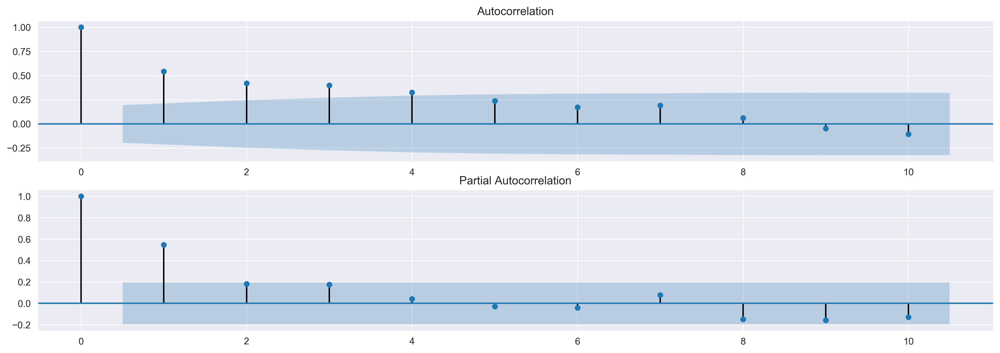

In [30]:
# Import
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(18,6), dpi = 300)
plot_acf(earthquakes["earthquakes_per_year"], lags=10, zero=True, ax = ax1)
plot_pacf(earthquakes["earthquakes_per_year"], lags=10, zero=True, ax = ax2)

plt.show()

### 5.1.2 - Deducing model order with ACF and PACF <a id="5.1.2"></a>

By comparing the ACF and PACF for a time series we can deduce the model order:

- If the amplitude of the ACF tails off with increasing lag and the PACF cuts off after some lag p, then we have a AR(p) model.

- If the amplitude of the ACF cuts off after some lag q and the amplitude of the PACF tails off then we have a MA(q) model.

- If both the ACF and PACF tail off then we have an ARMA model. In this case we can't deduce the model orders of p and q from the plot.

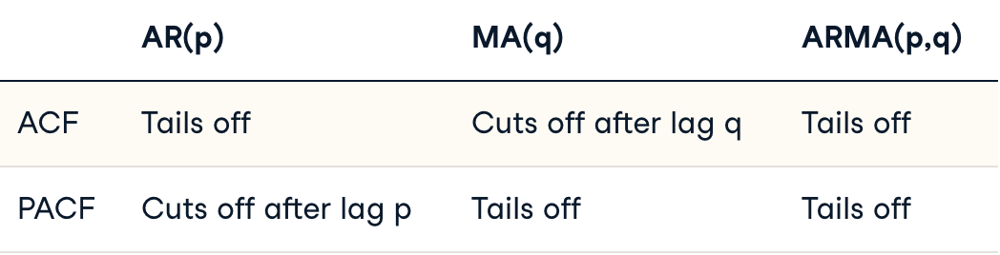

In [31]:
Image(filename = "images/model_order.png", width=600, height=600)

### 5.1.3 - Example: earthquakes model order <a id="5.1.3"></a>

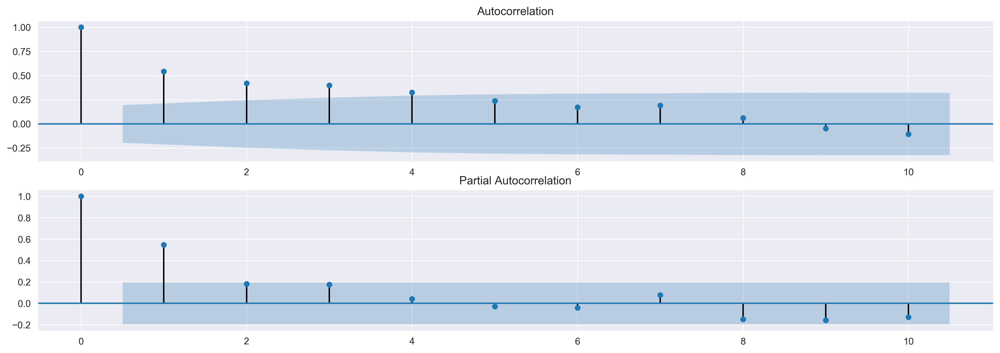

In [32]:
# Import
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(18,6), dpi = 300)
plot_acf(earthquakes["earthquakes_per_year"], lags=10, zero=True, ax = ax1)
plot_pacf(earthquakes["earthquakes_per_year"], lags=10, zero=True, ax = ax2)

plt.show()

Since the ACF tails off and the PACF cuts off at lag 1, it seems that the most appropriate model for the earthquake data is an AR(1) model!

## 5.2 - Intro to AIC and BIC <a id="5.2"></a>

We mentioned how ACF and PACF can't be used to choose the order of a model, when both of the orders p and q are non-zero. However there are more tools we can use, the **AIC** and the **BIC**.

The Akaike information criterion, or **AIC**, is a metric which tells us how good a model is. A model which makes better predictions is given a lower AIC score. The AIC also penalizes models which have lots of parameters. This means if we set the order too high compared to the data, we will get a high AIC value. This stops us overfitting to the training data.

The Bayesian information criterion, or **BIC**, is very similar to the AIC. Models which fit the data better have lower BICs and the BIC penalizes overly complex models.

For both of these metrics a lower value suggests a better model. The difference between these two metrics is how much they penalize model complexity. The BIC penalizes additional model orders more than AIC and so the BIC will sometimes suggest a simpler model. The AIC and BIC will often choose the same model, but when they don't we will have to make a choice. If our goal is to identify good predictive models, we should use AIC. However if our goal is to identify a good explanatory model, we should use BIC.

### 5.2.1 - Example: earthquakes AIC and BIC <a id="5.2.1"></a>

Using the ACF and PACF we decided that this dataset looked like an AR(1) process.

We will apply an AIC-BIC order search for the earthquakes time series to see if we get the same results.

In [33]:
# Loop over p values from 0-2
order_aic_bic=[]
for p in range(3):
    # Loop over q values from 0-2
    for q in range(3):
        try:
            # create and fit ARMA(p,q) model
            model = SARIMAX(earthquakes[["earthquakes_per_year"]], order = (p, 0, q), freq = "AS")
            results = model.fit()
            # Print order and results
            order_aic_bic.append((p, q, results.aic, results.bic))
        except:
            order_aic_bic.append((p, q, None, None))
            
order_df = pd.DataFrame(order_aic_bic, 
                        columns=['p', 'q', 'AIC', 'BIC'])

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, Valu

In [34]:
order_df.sort_values("AIC").head(3)

,p,q,AIC,BIC
4,1,1,647.132300,654.917660
5,1,2,648.738566,659.119046
7,2,1,648.842840,659.223319


In [35]:
order_df.sort_values("BIC").head(3)

,p,q,AIC,BIC
4,1,1,647.132300,654.917660
5,1,2,648.738566,659.119046
7,2,1,648.842840,659.223319


The AIC and BIC both actually favor an ARMA(1,1) model. 

This isn't what we predicted from the ACF and PACF but notice that the lag 2-3 PACF values are very close to significant, so the ACF/PACF are close to those of an ARMA(p,q) model.

## 5.3 - Model diagnostics <a id="5.3"></a>

Our work isn't finished once we have built the model. The next step is using common model diagnostics to confirm our model is behaving well. After we have picked a final model or a final few models we should ask how good they are. This is a key part of the model building life cycle.

To diagnose our model we focus on the residuals to the training data. The residuals are the difference between the our model's one-step-ahead predictions and the real values of the time series.

We might like to know, on average, how large the residuals are and so how far our predictions are from the true values. To answer this we can calculate the mean absolute error of the residuals. For an ideal model the residuals should be uncorrelated white Gaussian noise centered on zero.

### 5.3.1 - Example: earthquakes model diagnostics <a id="5.3.1"></a>

We saw before that we should model the earthquakes data set with a SARIMAX(1,0,1). Let's fit this model to the data and make some model diagnostics:

In [36]:
model = SARIMAX(earthquakes["earthquakes_per_year"], order = (1, 0, 1))
results = model.fit()

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  % freq, ValueWarning)


First, we should look at the results summary:

In [37]:
print(results.summary())

                                SARIMAX Results                                 
Dep. Variable:     earthquakes_per_year   No. Observations:                   99
Model:                 SARIMAX(1, 0, 1)   Log Likelihood                -320.566
Date:                  Sat, 12 Dec 2020   AIC                            647.132
Time:                          22:04:26   BIC                            654.918
Sample:                      01-01-1900   HQIC                           650.282
                           - 01-01-1998                                         
Covariance Type:                    opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9893      0.014     70.282      0.000       0.962       1.017
ma.L1         -0.5517      0.089     -6.198      0.000      -0.726      -0.377
sigma2        37.0254      4.980    

- Prob(Q) is the p-value associated with the null hypothesis that the residuals have no correlation structure. 

- Prob(JB) is the p-value associated with the null hypothesis that the residuals are Guassian normally distributed. 

- If either p-value is less than 0.05 we reject that hypothesis.

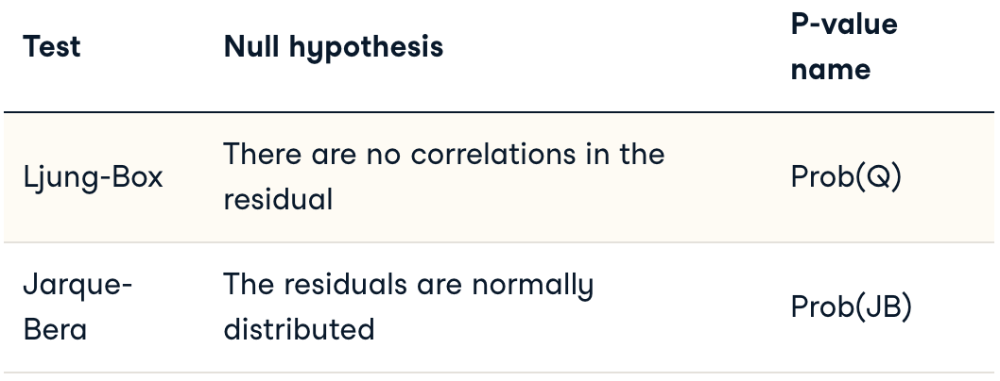

In [38]:
Image(filename = "images/residuals_stats.png", width=600, height=600)

Based on the outcomes of the tests in the summary, we can say that residuals are normally distributed and not correlated.

We can also see some plots that will help us to make model diagnostics:

- Residuals plot: shows the one-step-ahead standardized residuals. If our model is working correctly, there should be no obvious structure in the residuals.

- Histogram plus estimated density: shows us the distribution of the residuals. The histogram shows us the measured distribution; the orange line shows a smoothed version of this histogram; and the green line, shows a normal distribution. If our model is good these two lines should be almost the same. 

- Normal Q-Q: If our residuals are normally distributed then all the points should lie along the red line, except perhaps some values at either end.

- Correlogram: is just an ACF plot of the residuals rather than the data. 95% of the correlations for lag greater than zero should not be significant. If there is significant correlation in the residuals, it means that there is information in the data that our model hasn't captured.

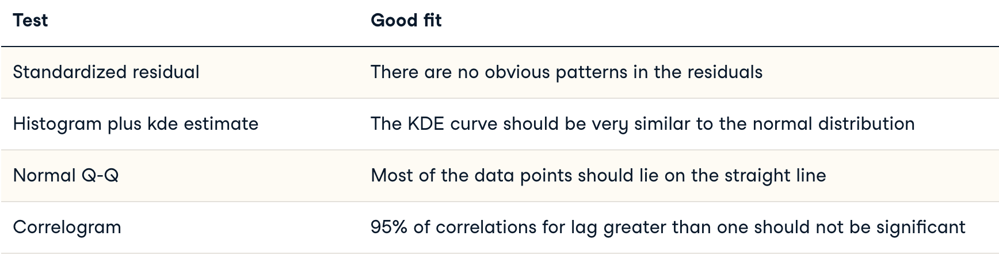

In [39]:
Image(filename = "images/plot_diag.png", width=800, height=800)

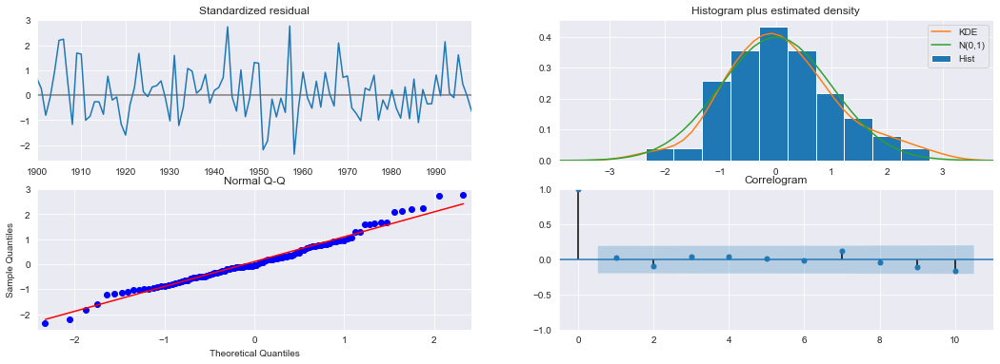

In [40]:
fig = results.plot_diagnostics(figsize=(18,6))

The 4 plots seems to be ok!

## 5.4 - The Box-Jenkins method <a id="5.4"></a>

The Box-Jenkins method is a kind of checklist for you to go from raw data to a model ready for production. The three main steps that stand between you and a production-ready model are:

1. **Identification**: we explore and characterize the data to **find some form of it which is appropriate to ARIMA modeling**. We need to know whether the time series is stationary and find which transformations, such as differencing or taking the log of the data, will make it stationary. Once we have found a stationary form, we must identify which orders p and q are the most promising. Our tools to test for stationarity include plotting the time series and using the augmented Dicky-Fuller test. Then we can take the difference or apply transformations until we find the simplest set of transformations that make the time series stationary. Finally we use the ACF and PACF to identify promising model orders.

2. **Estimation**: involves using numerical methods to **estimate the AR and MA coefficients** of the data. This is automatically done for us when we call the model's .fit method. At this stage we might fit many models and use the AIC and BIC to narrow down to more promising candidates.


3. **Model diagnostics**: we **evaluate the quality of the best fitting model**. Here is where we use our test statistics and diagnostic plots to make sure the residuals are well behaved.

# 6 - Seasonal ARIMA models (SARIMA) <a id="6"></a>

## 6.1 - Seasonal time series <a id="6.1"></a>

Now we will learn about seasonal time series and how we can extend the ARIMA model to predict seasonal data.

A seasonal time series has predictable patterns that repeat regularly. Although we call this feature seasonality, it can repeat after any length of time. These seasonal cycles might repeat every year like sales of suncream, or every week like number of visitors to a park, or every day like number of users on a website at any hour.

## 6.2 - Finding seasonal period using ACF <a id="6.2"></a>

Often we'll be able to guess the seasonal period, but we can also use the ACF to identify it. 

**To find this frequency we look for a lag greater than one, which is a peak in the ACF plot**. 

Remember that in order to generate the ACF plot, the time series should be stationary so it will be easier to interpret the plot.

### 6.2.1 - Example: finding seasonal period using ACF in the CO2 dataset <a id="6.2.1"></a>

Let's try to find the lenght of the seasonal period in the CO2 dataset.

First we plot the time series:

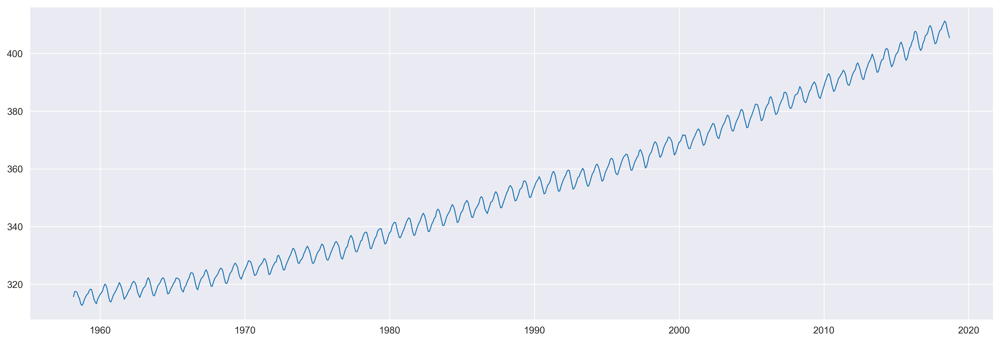

In [41]:
plt.figure(figsize=(18,6), dpi = 300)
x = co2.index
y = co2.CO2_ppm
plt.plot(x, y, linewidth = 1)
#plt.title("IPG3113N production", fontsize = 18)
plt.show()

This time series isn't stationary, since it has a positive trend.

In [42]:
result = adfuller(co2.CO2_ppm)
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 1.0


Remember that in order to generate the ACF plot, the time series should be stationary so it will be easier to interpret the plot:

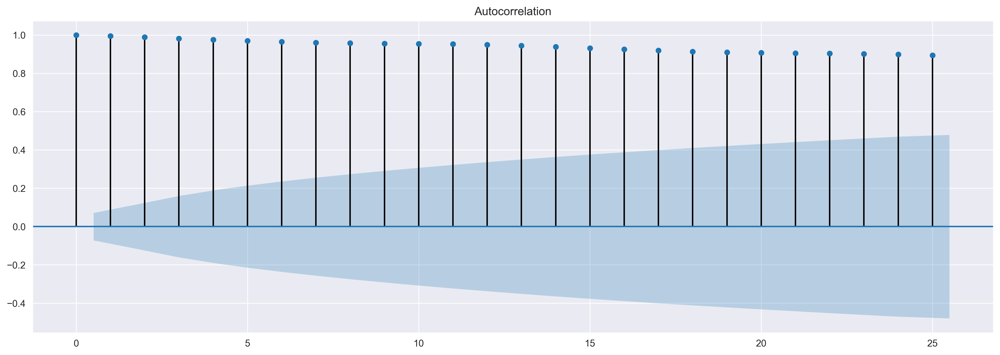

In [43]:
# Import
from statsmodels.graphics.tsaplots import plot_acf
fig, ax1 = plt.subplots(1,1, figsize=(18,6), dpi = 300)
plot_acf(co2.CO2_ppm, lags=25, zero=True, ax = ax1)
plt.show()

Let's transform the time series in order to make it stationary:

In [44]:
co2["diff_1"] = co2["CO2_ppm"].diff()
co2 = co2.dropna()

In [45]:
result = adfuller(co2["diff_1"])
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 5.813789175332047e-06


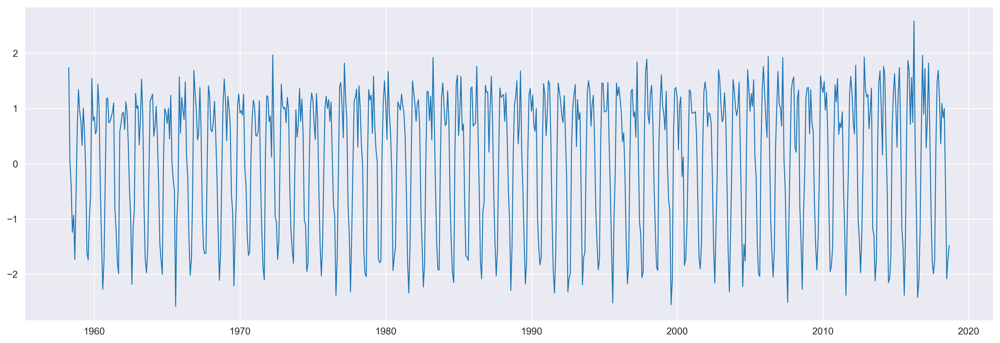

In [46]:
plt.figure(figsize=(18,6), dpi = 300)
x = co2.index
y = co2.diff_1
plt.plot(x, y, linewidth = 1)
#plt.title("IPG3113N production", fontsize = 18)
plt.show()

Now that we have a stationary transformed time series, let's plot the ACF:

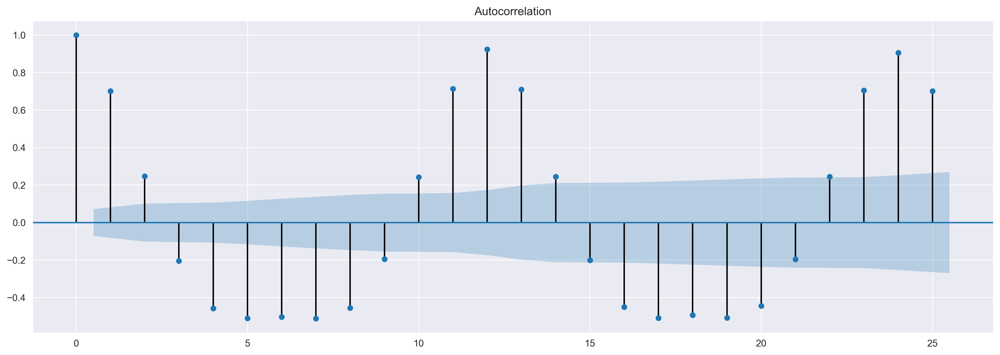

In [47]:
# Import
from statsmodels.graphics.tsaplots import plot_acf
fig, ax1 = plt.subplots(1,1, figsize=(18,6), dpi = 300)
plot_acf(co2.diff_1, lags=25, zero=True, ax = ax1)
plt.show()

It seems that the series has a seasonal period of 12! Remember that the CO2 time series frequency is monthly, so that means that apparently the series repeats yearly in some way. 

Let's confirm this with a plot:

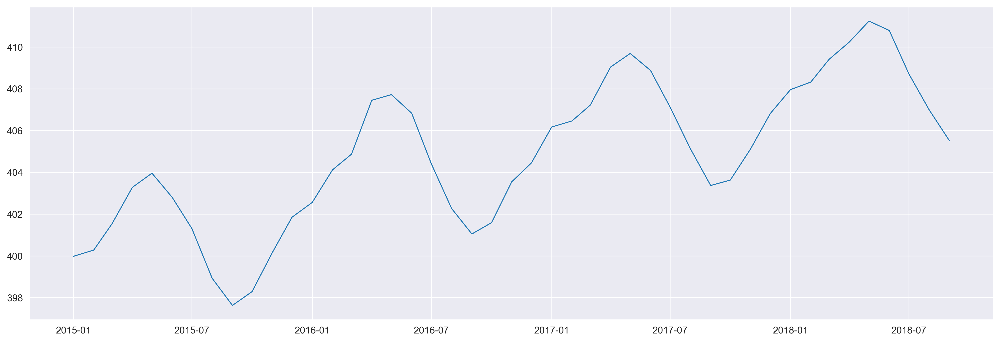

In [48]:
plt.figure(figsize=(18,6), dpi = 300)
x = co2[co2.index >= "2015"].index
y = co2[co2.index >= "2015"].CO2_ppm
plt.plot(x, y, linewidth = 1)
#plt.title("IPG3113N production", fontsize = 18)
plt.show()

## 6.3 - Seasonal decomposition <a id="6.3"></a>

We can think of any time series as being made of 3 parts: the **trend**, the **seasonal component**, and the **residual**. 

We can use the statsmodels seasonal_decompose function to separate out any time series into these three components, **but we need to set the parameter freq**, which is the number of data points in each repeated cycle (or how often the cycles repeat).

### 6.3.1 - Example: CO2 seasonal decomposition <a id="6.3.1"></a>

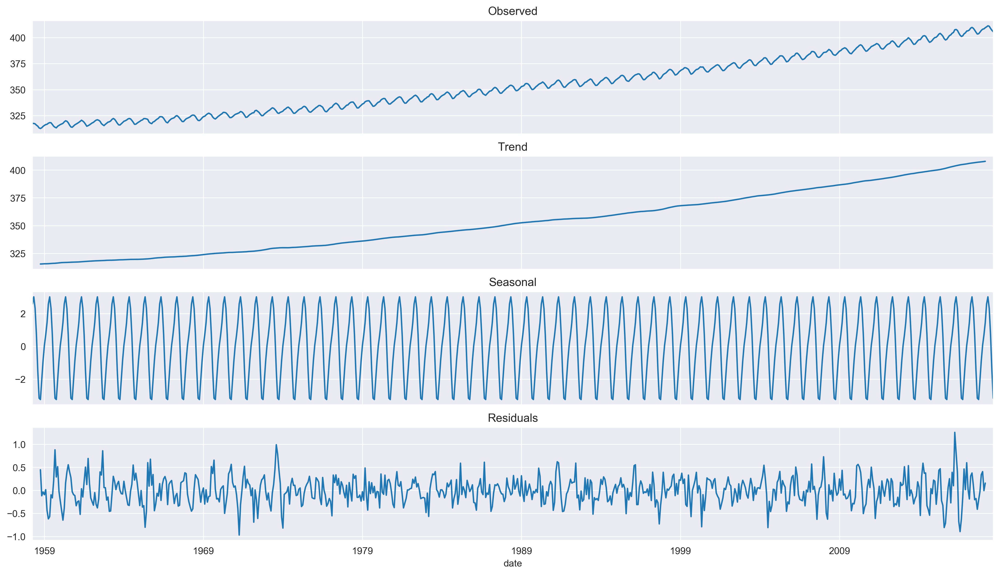

In [49]:
# Import seasonal decompose
from statsmodels.tsa.seasonal import seasonal_decompose

# Perform additive decomposition


# Plot decomposition
#plt.figure(figsize=(18,6), dpi = 300)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=1, nrows=4, sharex=True, figsize=(18,10), dpi=300)
decomp = seasonal_decompose(co2["CO2_ppm"], 
                            period=12)

decomp.observed.plot(ax = ax1, title = "Observed")
decomp.trend.plot(ax = ax2, title = "Trend")
decomp.seasonal.plot(ax = ax3, title = "Seasonal")
decomp.resid.plot(ax = ax4, title = "Residuals")

plt.show()

## 6.4 - SARIMA models <a id="6.4"></a>

When we have seasonal data we will always have correlated residuals left if we try to fit an ARIMA model to it. This means that we aren't using all of the information in the data, and so we aren't making the best predictions possible.

A **SARIMA** or seasonal ARIMA model is the tool of choice for seasonal time series. Previously we saw that we could split up our time series into a seasonal and some non-seasonal components. 

Fitting a SARIMA model is like fitting two different ARIMA models at once, one to the seasonal part and another to the non-seasonal part.

Since we have these two models we will have two sets of orders. We have non-seasonal orders for the autoregressive, difference and moving average parts. We also have this set of orders for the seasonal part. We use capital P, D and Q for these seasonal orders. There is also a new order, S, which is the length of the seasonal cycle.

We import the model object and fit it as before. The only difference is that we have to specify the seasonal order as well as the regular order when we instantiate the model. This means that there are a lot of model orders we need to find.

## 6.5 - Seasonal differencing <a id="6.5"></a>

To make a time series stationary we may need to apply seasonal differencing. 

In seasonal differencing, instead of subtracting the most recent time series value, we subtract the time series value from one cycle ago. We can take the seasonal difference by using the DataFrame.diff method. This time we pass in an integer S, the length of the seasonal cycle.

## 6.6 - Example: finding all SARIMA orders for the CO2 dataset <a id="6.6"></a>

In [50]:
df_co2 = co2.copy()

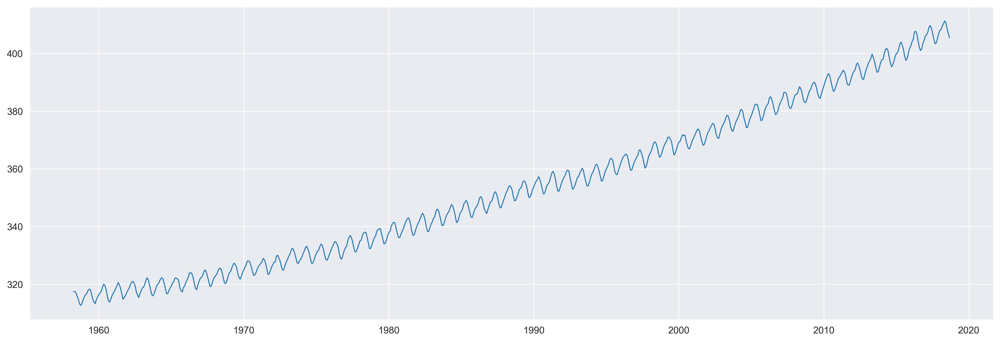

In [51]:
plt.figure(figsize=(18,6), dpi = 300)
x = df_co2.index
y = df_co2.CO2_ppm
plt.plot(x, y, linewidth = 1)
#plt.title("IPG3113N production", fontsize = 18)
plt.show()

We have to eliminate the trend and seasonality:
- If the time series shows a trend then we take the normal difference.
- If there is a strong seasonal cycle, then we will also take the seasonal difference.

In [52]:
df_co2["diff"] = df_co2["CO2_ppm"].diff(1).diff(12)
df_co2 = df_co2.dropna()

In [53]:
result = adfuller(df_co2["diff"])
p_value = result[1]
print(f'The p-value of the test is {p_value}')

The p-value of the test is 1.0808419199032977e-19


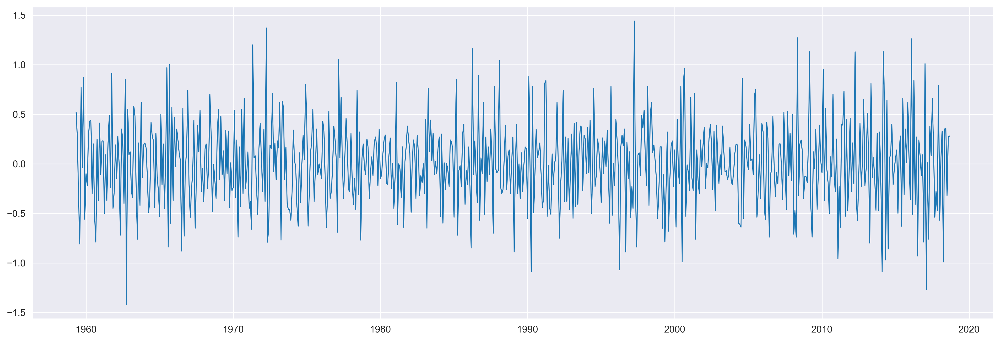

In [54]:
plt.figure(figsize=(18,6), dpi = 300)
x = df_co2.index
y = df_co2["diff"]
plt.plot(x, y, linewidth = 1)
#plt.title("IPG3113N production", fontsize = 18)
plt.show()

Once we have found the two orders of differencing, and made the time series stationary, we need to find the other model orders.

To find the non-seasonal orders, we plot the ACF and the PACF of the differenced time series:

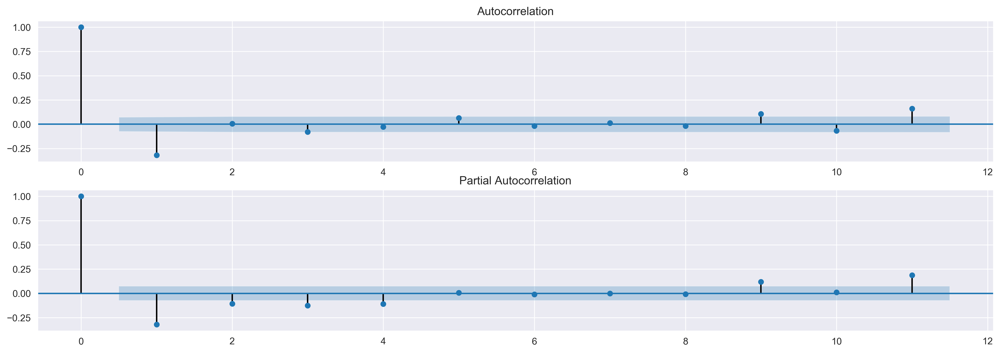

In [55]:
# Import
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(18,6), dpi = 300)
plot_acf(df_co2["diff"], lags=11, zero=True, ax = ax1)
plot_pacf(df_co2["diff"], lags=11, zero=True, ax = ax2)

plt.show()

Maybe $p=0$, $q=1$.

To find the seasonal orders we plot the ACF and PACF of the differenced time series at multiple seasonal steps. Then we can use the same table of ACF and PACF rules to work out the seasonal order.

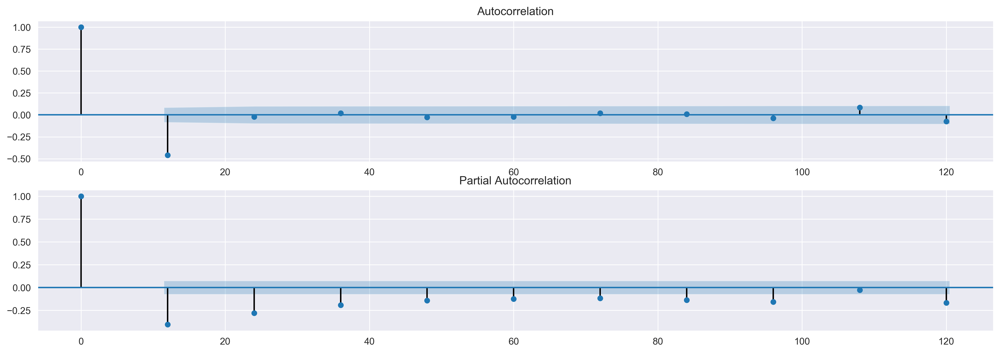

In [56]:
# Import
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(18,6), dpi = 300)

lags = [12 * i for i in range(11)]
plot_acf(df_co2["diff"], lags=lags, zero=True, ax = ax1)
plot_pacf(df_co2["diff"], lags=lags, zero=True, ax = ax2)

plt.show()

In [57]:
df_co2.tail()

,CO2_ppm,diff_1,diff
date,,,
2018-05-01,411.24,1.00,0.35
2018-06-01,410.79,-0.45,0.36
2018-07-01,408.71,-2.08,-0.32
2018-08-01,406.99,-1.72,0.27
2018-09-01,405.51,-1.48,0.28


Maybe $P=0$, $Q=1$.

In [58]:
model = SARIMAX(df_co2[["CO2_ppm"]], order=(0,1,1), seasonal_order=(0,1,1,12))

# Fit ARIMA model
results = model.fit()

# Generate predictions
forecast = results.get_prediction(start= "2018-05-01", end= "2020-05-01")

# Extract prediction mean
mean_forecast = forecast.predicted_mean

# Get confidence intervals of  predictions
confidence_intervals = forecast.conf_int()

# Select lower and upper confidence limits
d_lower_limits = confidence_intervals.loc[:,'lower CO2_ppm']
d_upper_limits = confidence_intervals.loc[:,'upper CO2_ppm']

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


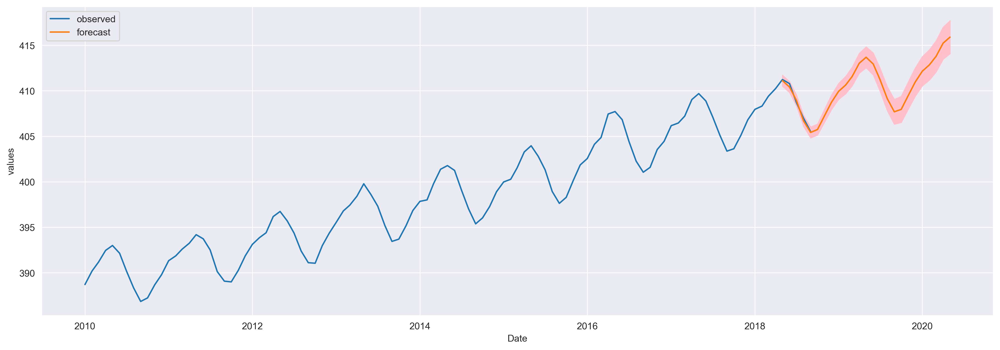

In [59]:
plt.figure(figsize=(18,6), dpi = 300)

plt.plot(df_co2[df_co2.index >= "2010"].index, df_co2[df_co2.index >= "2010"].CO2_ppm, label='observed')

plt.plot(mean_forecast.index, mean_forecast, label='forecast')
plt.fill_between(d_lower_limits.index, d_lower_limits, d_upper_limits, color='pink')

plt.xlabel('Date')
plt.ylabel('values')
plt.legend()
plt.show()